In [ ]:
!pip install openai-clip
!pip install --upgrade diffusers[torch]
!pip install -qq diffusers datasets accelerate wandb open-clip-torch

## Background of the model
* This model is a diffusion model initialized from [Google DDPM-bedroom-256](https://huggingface.co/google/ddpm-bedroom-256) and trained for 5000 steps on dataset [huggan/wikiart](https://huggingface.co/datasets/huggan/wikiart). [Script to train model (colab ipynb)](https://colab.research.google.com/drive/1EnvN5OQMRzZZDAZJWDCVq4ETau9-JnCu?usp=sharing)

* wikiart Dataset containing 81,444 pieces of visual art from various artists, taken from WikiArt.org, along with class labels for each image. It contains 27 types of styles.

* while the ddpm scheduler yields the highest quality, it also takes the longest. For a good trade-off between quality and inference speed you might want to consider the ddim or pndm schedulers instead.
* [DDPM paper](https://arxiv.org/pdf/2006.11239.pdf)
* 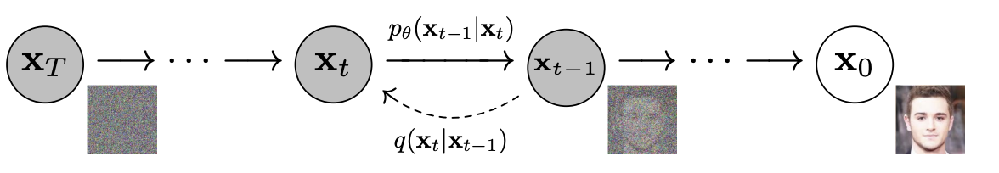
* Forward Process: This process starts with one data point and gradually adds noise until the data is completely transformed into noise. It is a Markov chain that adds a certain amount of Gaussian noise at each step, the process is deterministic and can be reversed.

* Reverse Diffusion (Reverse Process): the reverse process is a reversal of the diffusion process, which starts with pure noise and gradually removes the noise to recover the data. This process is a parameterized Markov chain that needs to be trained to learn how to reverse the diffusion process.

* Training: The inverse process is trained by optimizing a variational bound. This lower bound is calculated by comparing the difference between the inverse process and the real data distribution. The goal of training is to enable the inverse process to generate samples that match the real data distribution.

* Sampling: To generate samples, a noise vector is sampled from the standard normal distribution as a starting point, and then the data is generated step by step through the inverse process. At each step, the model predicts how the current noise vector should change to more closely match the true data distribution.

* Progressive Generation: The diffusion model's generation process is progressive, meaning that it generates a rough outline of the image first and then adds details gradually. This property makes the images generated by the diffusion model have high fidelity.

* Connection to Autoregressive Models: A diffusion model can be viewed as an autoregressive model in which each part of the data is generated not in a regular order, but in a specific order determined by the diffusion process.

* Potential Applications: Diffusion models have the potential to be used in a variety of fields such as data compression, art creation, image editing, etc. due to their ability to generate high quality samples.



* wikiart Dataset containing 81,444 pieces of visual art from various artists, taken from WikiArt.org, along with class labels for each image. It contains 27 types of styles.

* 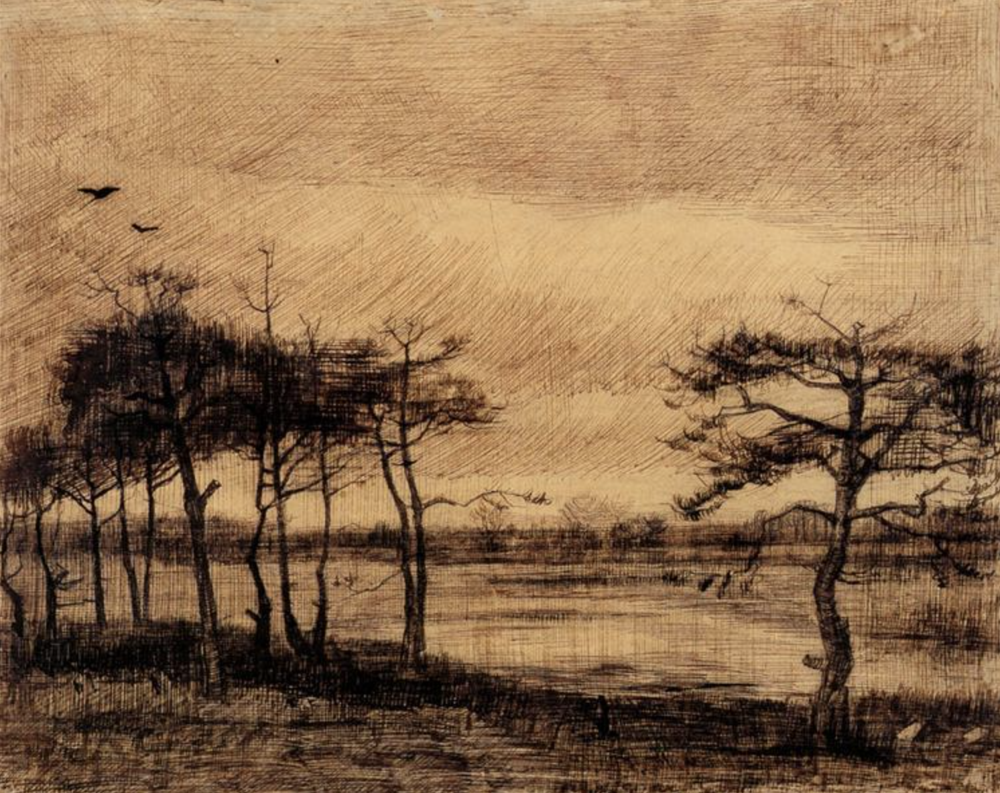

In [3]:
import numpy as np
import torch
import torch.nn.functional as F
import torchvision
from datasets import load_dataset
from diffusers import DDIMScheduler, DDPMPipeline
from matplotlib import pyplot as plt
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm


In [6]:
device = (
    "mps"
    if torch.backends.mps.is_available()
    else "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

In [7]:
def get_ddpm_model():
    pipeline_name = "./base_model"
    image_pipe = DDPMPipeline.from_pretrained(pipeline_name).to(device)
    scheduler = DDIMScheduler.from_pretrained(pipeline_name)
    return image_pipe, scheduler

## Discussion for general results
* Try to figure out the best inference step to generate a human readable image.
* Set the inference step changing in (10,50,100,200,400) and visualize their results.

In [2]:
import matplotlib.pyplot as plt
import torchvision

num_inference_steps_list = [10, 50, 100, 200,400]

fig, axes = plt.subplots(len(num_inference_steps_list), 1, figsize=(10, 10))

for idx, num_inference_steps in enumerate(num_inference_steps_list):
    image_pipe, scheduler = get_ddpm_model()
    scheduler.set_timesteps(num_inference_steps=num_inference_steps)
    
    x = torch.randn(4, 3, 256, 256).to(device)

    for i, t in tqdm(enumerate(scheduler.timesteps)):
        model_input = scheduler.scale_model_input(x, t)
        with torch.no_grad():
            noise_pred = image_pipe.unet(model_input, t)["sample"]
        x = scheduler.step(noise_pred, t, x).prev_sample

    grid = torchvision.utils.make_grid(x, nrow=4)
    axes[idx].imshow(grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5)
    axes[idx].set_title(f"Num Inference Steps: {num_inference_steps}")

plt.tight_layout()
plt.show()


* 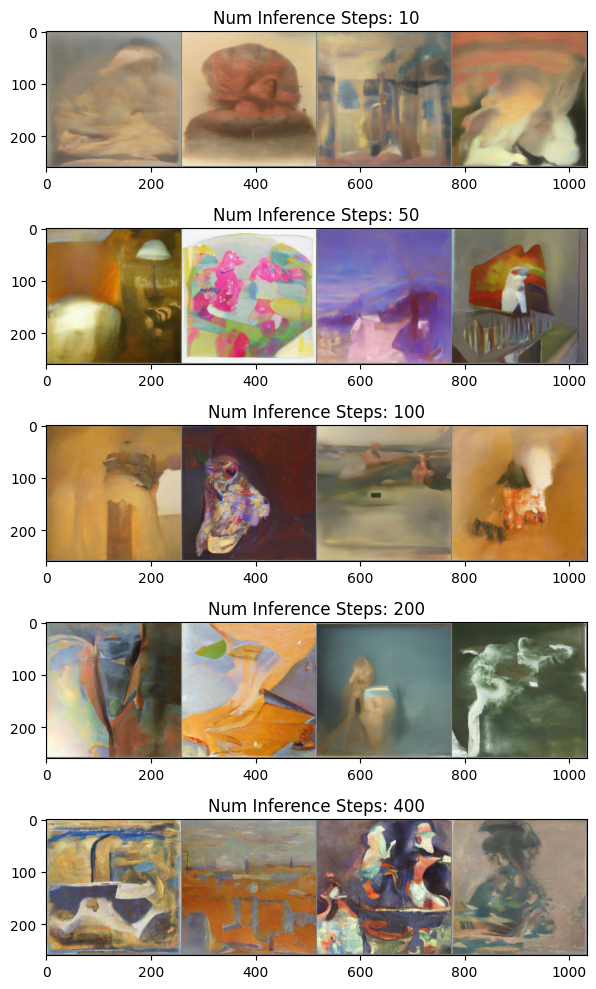

* As in the above code, we successfully loaded the pre-trained Diffusion model and iterated it in conjunction with the DDIMScheduler and simulated the state at the end of the forward process with randomly generated noise x
* After that, the backward sample is performed, with a total of 10, 50, 100, and 400 steps. It can be seen that the lines of the image are gradually becoming clearer from the very beginning at 10.
* But when we look at the content of the image further, we find it difficult to identify the content of the image because the generation is randomized and we want to increase the control over the content of the generated image.
* As the number of iterative steps increases, the content complexity of the image rises and the linearity of the content becomes clearer

## Improve of Diffusion result -- PartI
### Preliminary background control
* The idea is to define a mean-square error loss function so that the pixel values of the generated image are as close as possible to the target color;
* Given an RGB value, a loss value is returned that measures how much the pixel value of the image differs from the target color;
* First normalize target_color so that it takes values in the interval (-1, 1)
* Change the shape of the generated target tensor to (b, c, h, w) to fit the shape of the input image images
* Calculate the pixel values of the image and the mean square error of the target color
    * Here the target color is a light green
 

In [ ]:
def color_loss(images, target_color=(0.1, 0.9, 0.5)):
   
    target = (
        torch.tensor(target_color).to(images.device) * 2 - 1
    )  # 
    target = target[
        None, :, None, None
    ]  # 
    error = torch.abs(
        images - target
    ).mean()  # 
    return error

* 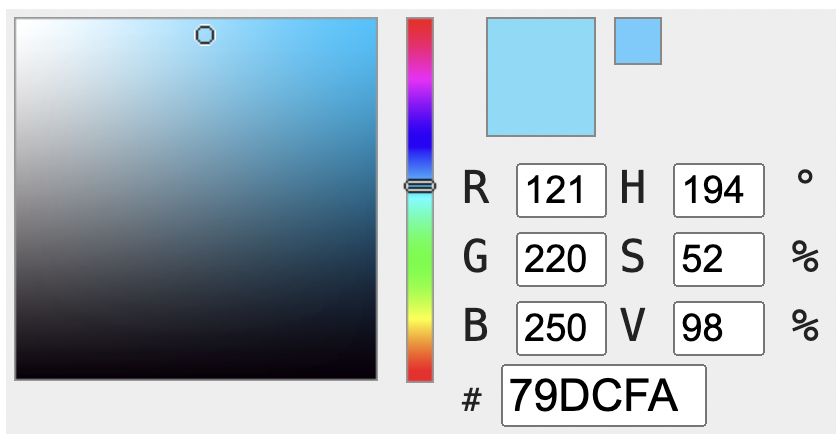

* Next, the sampling loop operation needs to be modified, as follows:
* Create an input image X, and set requires_grad to True;
* Calculate the "denoised" image X0;
* Pass the denoised image X0 to the loss function;
* Calculate the gradient of the loss function with respect to the input image X;
* Before using the scheduler, modify the input image X with the calculated gradient to improve the input image X in the direction of reducing the loss value.
* There are two methods to realize the above steps:
* Method 1: Get the noise prediction from UNet and set the requires_grad attribute of the input image X to True, which makes full use of the memory (since there is no need to track the gradient through the diffusion model), but this will result in a decrease in the accuracy of the gradient;
* Method 2: Set the requires_grad property of the input image X to True, then pass it to UNet and compute the "denoised" image X0;
* Here are the results of these two methods:

In [ ]:
def generate_background_image_UNet(guidance_loss_scale=20):
    x = torch.randn(4, 3, 256, 256).to(device)
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        model_input = scheduler.scale_model_input(x, t)
        with torch.no_grad():
            noise_pred = image_pipe.unet(model_input, t)["sample"]
            # need x can be graded
        x = x.detach().requires_grad_()
        # remove the noise for one step
        x0 = scheduler.step(noise_pred, t, x).pred_original_sample
        loss = color_loss(x0) * guidance_loss_scale

        if i % 10 == 0:
            print(i, "loss:", loss.item())
        cond_grad = -torch.autograd.grad(loss, x)[0]
        x = x.detach() + cond_grad
        x = scheduler.step(noise_pred, t, x).prev_sample
    grid = torchvision.utils.make_grid(x, nrow=4)
    im = grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5
    Image.fromarray(np.array(im * 255).astype(np.uint8))
    return im

## Failure Cases
* In previous experiment we find that we need num_inference_steps lager than 50 to make the generated image be clear enough. But for each iteration, there will be guidance_loss_scale multiplied to make it closer to the target color
* So maybe we can adjust the guidance_loss_scale which range is [5,100] to get better result

In [ ]:
image_pipe, scheduler = get_ddpm_model()
scheduler.set_timesteps(num_inference_steps=100)
im = generate_background_image_UNet(guidance_loss_scale=20)
Image.fromarray(np.array(im * 255).astype(np.uint8))

* 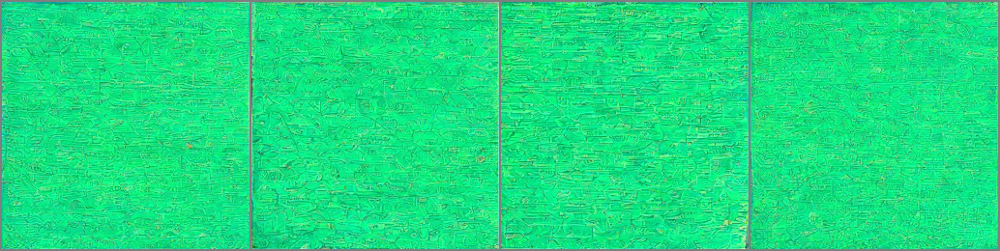

In [ ]:
image_pipe, scheduler = get_ddpm_model()
scheduler.set_timesteps(num_inference_steps=100)
im = generate_background_image_UNet(guidance_loss_scale=5)
Image.fromarray(np.array(im * 255).astype(np.uint8))

* 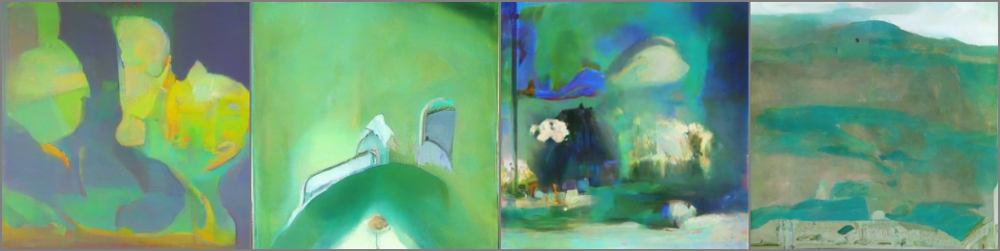

In [ ]:
def generate_background_image_clip(guidance_loss_scale=20):
    x = torch.randn(4, 3, 256, 256).to(device)

    for i, t in tqdm(enumerate(scheduler.timesteps)):
        x = x.detach().requires_grad_()
        model_input = scheduler.scale_model_input(x, t)
        noise_pred = image_pipe.unet(model_input, t)["sample"]

        x0 = scheduler.step(noise_pred, t, x).pred_original_sample
        loss = color_loss(x0) * guidance_loss_scale

        if i % 10 == 0:
            print(i, "loss:", loss.item())
        cond_grad = -torch.autograd.grad(loss, x)[0]

        x = x.detach() + cond_grad
        x = scheduler.step(noise_pred, t, x).prev_sample

    grid = torchvision.utils.make_grid(x, nrow=4)
    im = grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5
    return im

In [ ]:
guidance_loss_scale = 3
image_pipe, scheduler = get_ddpm_model()
scheduler.set_timesteps(num_inference_steps=100)
im = generate_background_image_clip(guidance_loss_scale=guidance_loss_scale)
Image.fromarray(np.array(im * 255).astype(np.uint8))

* 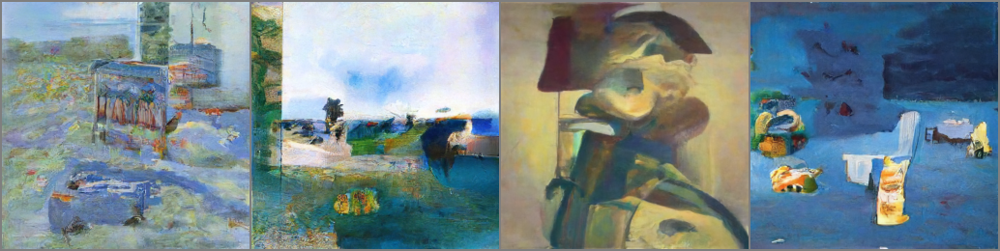

## Summary
* we use two methods to perform the control of the background
* the second way is not as good as the first one.  
* both of them can change the control level for each step by changing guidance_loss_scale
* these failure cases are generated since guidance_loss_scale is to large or the iteration step. (as we need to make sure the iteration step is larger than some threshold to get a specific object.)
* So I just use smaller enough guidance_loss_scale for larger iteration step

## Improve of Diffusion result -- PartII
### Use CLIP to Control the image generation
* Although we implement some basic control of the background of the image by capturing the loss between the target and current Gaussian noise x, sometimes extremely hard for us to represent the target into a embedding vector that can be used in optimizing
* so we use [CLIP](https://arxiv.org/pdf/2103.00020.pdf) help us to convert the text prompt into word embedding , and try to minimize the loss between the text prompt embedding and the input image( here is the noise image start from random noise)
* CLIP using Contrastive pre-training, which makes it able to make the image into text embeeding for multimodal data
* The basic process for controlling image generation using CLIP is as follows:

* The Prompt is represented as 512embedding vectors using the CLIP model;

* In the process of generating the diffusion model, the following steps need to be performed multiple times:
* 1) Generate multiple "denoised" images;

* 2) Embedding each of the generated "denoised" images with the CLIP model and comparing the Prompt embedding with the image embedding;

* 3) Calculate the gradient of the Prompt and the denoised image, and use this gradient to update the input image X first, and then update X using the scheduler;

* 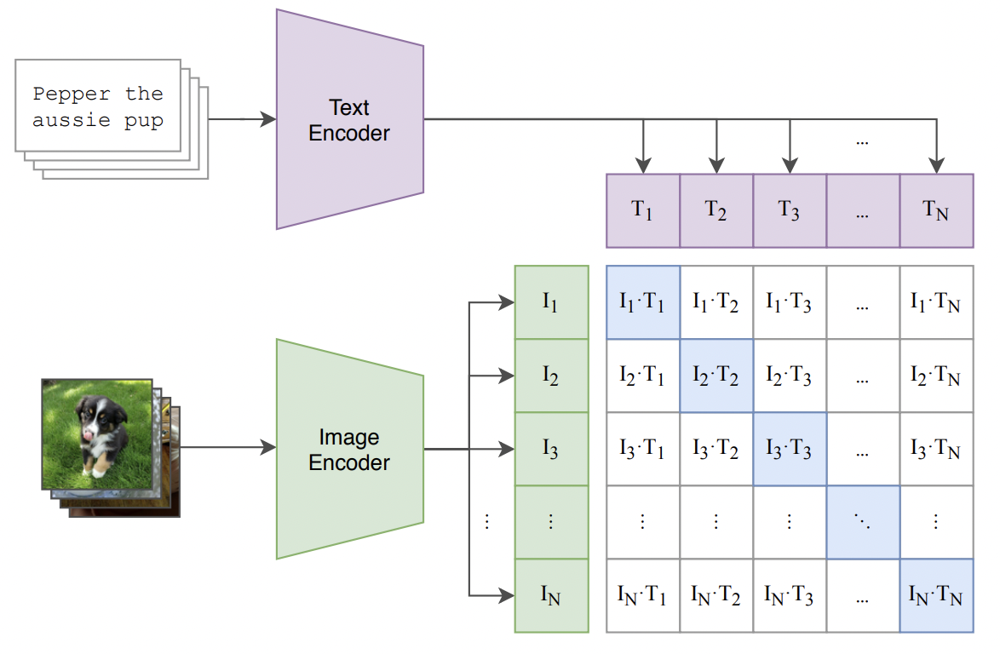

* As seen in the above figure, the second method is slightly less effective, but the output of the second method is closer to the data used to train the model, and the color migration effect can also be enhanced by modifying the guidance_loss_scale parameter.

* CLIP controlled image generation

    * Although the above methods can guide and control the image to generate a certain color, but now the more mainstream way of LLM is through the Prompt (just typing a few lines describing the needs) to get the image they want, then CLIP is a good choice. CLIP is a large model of graphic matching with OpenAI development, because the process is differentiable, so it can be used as a loss function to bootstrap the diffusion model.

* The basic process for controlling image generation using CLIP is as follows:

* The Prompt is represented as 512embedding vectors using the CLIP model;

* In the process of generating the diffusion model, the following steps need to be performed multiple times:

* (1) Generate multiple "denoised" images;

* (2) Embedding each of the generated "denoised" images with the CLIP model and comparing the Prompt embedding with the image embedding;

* (3) Calculate the gradient of the Prompt and the denoised image, use this gradient to first update the input image X, and then update X using the scheduler;


* Use: Image Transform: Used to modify the image size and augment the data, while normalizing the data to fit the CLIP model.
    * Random cropping
    * Random Twisted Pictures
    * Randomized left and right mirroring.
* Define a loss function to get the features of the image and then compare them with the features of the cue text
* Calculating Distance with Squared Great Circle Distance

In [6]:

import open_clip
clip_model, _, preprocess = open_clip.create_model_and_transforms(
    "ViT-B-32", pretrained="openai"
)
clip_model.to(device)
tfms = torchvision.transforms.Compose(
    [
        torchvision.transforms.RandomResizedCrop(224),# 
        torchvision.transforms.RandomAffine(5),       # 
        torchvision.transforms.RandomHorizontalFlip(),# 
        torchvision.transforms.Normalize(
            mean=(0.48145466, 0.4578275, 0.40821073),
            std=(0.26862954, 0.26130258, 0.27577711),
        ),
    ]
)
# 
def clip_loss(image, text_features):
    image_features = clip_model.encode_image(
        tfms(image)
    )  # 
    input_normed = torch.nn.functional.normalize(image_features.
       unsqueeze(1), dim=2)
    embed_normed = torch.nn.functional.normalize(text_features.
       unsqueeze(0), dim=2)
    dists = (
        input_normed.sub(embed_normed).norm(dim=2).div(2).
           arcsin().pow(2).mul(2)
    )  # 
    return dists.mean()

### scaling factor
* we define a function that can select the scaling factor above

In [ ]:
plt.plot([1 for a in scheduler.alphas_cumprod], label="no scaling")
plt.plot([a for a in scheduler.alphas_cumprod], label="alpha_bar")
plt.plot([a.sqrt() for a in scheduler.alphas_cumprod],
    label="alpha_bar.sqrt()")
plt.plot(
    [(1 - a).sqrt() for a in scheduler.alphas_cumprod], label="(1-alpha_bar).sqrt()"
)
plt.legend()

* 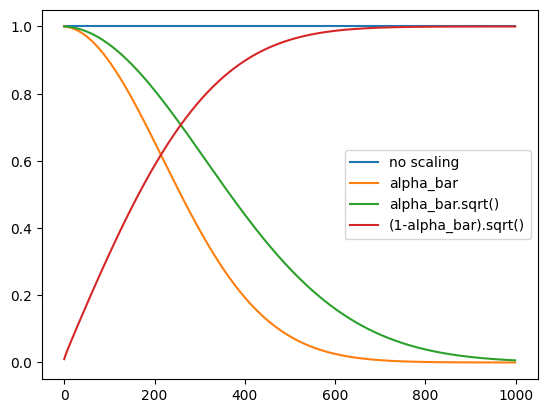

In [1]:
def get_alpha_parameter(alpha_bar, para_type:str):
    if para_type == 'no scaling':
        return 1
    elif para_type == 'alpha_bar':
        return alpha_bar
    elif para_type == 'alpha_bar.sqrt()':
        return alpha_bar.sqrt()
    elif para_type == '(1-alpha_bar).sqrt()':
        return (1-alpha_bar).sqrt()

* Here is how the bootstrap model generates an image, with steps similar to those above, except that the color_loss() is replaced with CLIP's loss function
* n_cuts used to average the effect of loss gradient

In [ ]:

def clip_prompt_diffusion(prompt,guidance_scale,n_cuts):

    image_pipe, scheduler = get_ddpm_model()

    scheduler.set_timesteps()

    text = open_clip.tokenize([prompt]).to(device)
    with torch.no_grad(), torch.cuda.amp.autocast():
        text_features = clip_model.encode_text(text)
    x = torch.randn(4, 3, 256, 256).to(
        device
    )
    for i, t in tqdm(enumerate(scheduler.timesteps)):
        model_input = scheduler.scale_model_input(x, t)
        
        with torch.no_grad():
            noise_pred = image_pipe.unet(model_input, t)["sample"]
        cond_grad = 0
        for cut in range(n_cuts):
            
            x = x.detach().requires_grad_()
            
            x0 = scheduler.step(noise_pred, t, x).pred_original_sample
            
            loss = clip_loss(x0, text_features) * guidance_scale
            
            cond_grad -= torch.autograd.grad(loss, x)[0] / n_cuts
        if i % 25 == 0:
            print("Step:", i, ", Guidance loss:", loss.item())
        
        alpha_bar = scheduler.alphas_cumprod[i]
        x = (
            x.detach() + cond_grad * get_alpha_parameter(alpha_bar,'(1-alpha_bar).sqrt()')
        )
    
        x = scheduler.step(noise_pred, t, x).prev_sample
    return x


prompt = "Red Rose (still life), red flower painting"
guidance_scale = 8
n_cuts = 4
iteration_step = 50
x = clip_prompt_diffusion(prompt,guidance_scale,n_cuts,iteration_step)
grid = torchvision.utils.make_grid(x.detach(), nrow=4)
im = grid.permute(1, 2, 0).cpu().clip(-1, 1) * 0.5 + 0.5
Image.fromarray(np.array(im * 255).astype(np.uint8))

* 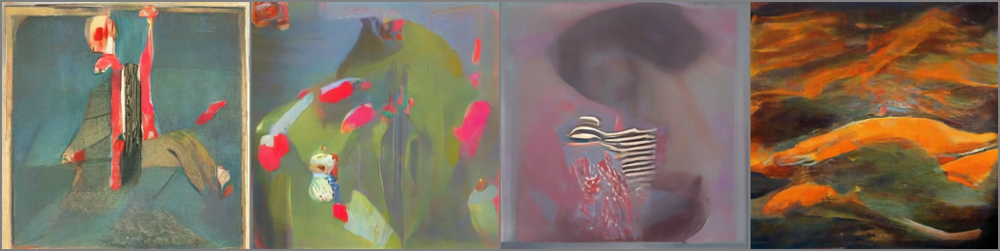

* the images above are failure cases since the iteration steps are too small 
change from 50 to 400


* 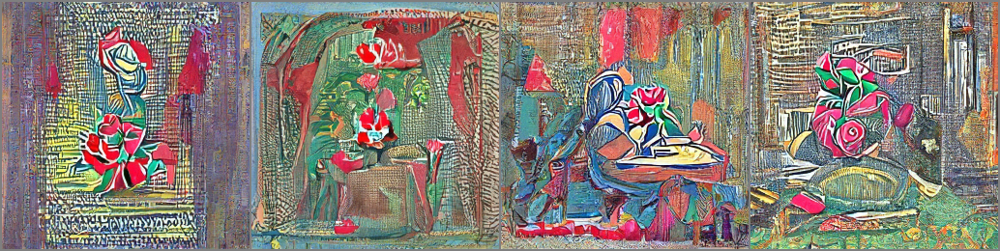

## CLIP model generated results
| Prompt                                                                                                       | Generated Images |
|--------------------------------------------------------------------------------------------------------------|------------------|
| Red Rose (still life), red flower painting                                                                  | 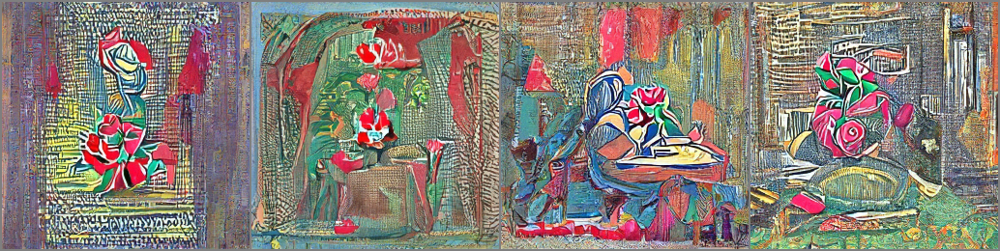          |
| Psychedelic: autumn forest landscape, psychedelic style, vibrant colors, swirling patterns, abstract forms, surreal, trippy, colorful | 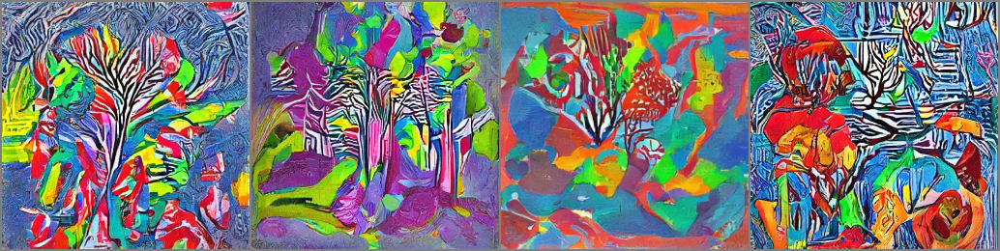          |
| Interior: a living room, bright modern Scandinavian style house, large windows, magazine photoshoot, 8k, studio lighting | 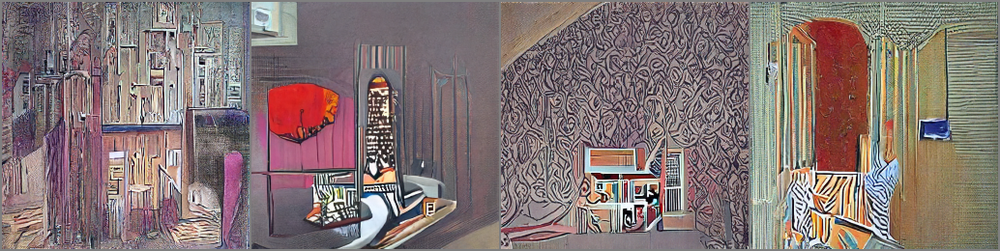      |
| Pixel: haunted house, pixel-art, low-res, blocky, pixel art style, 8-bit graphics, colorful                | 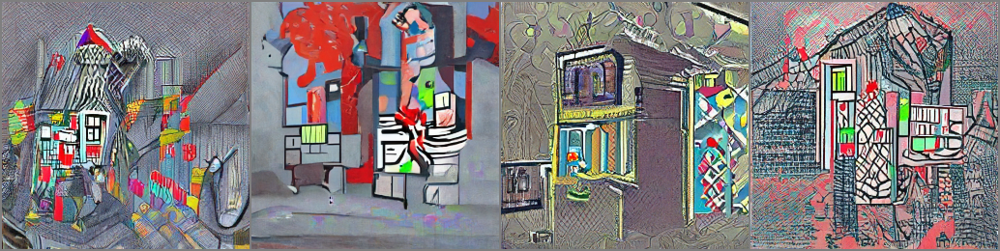         |


## Failure Cases
* Prompt sentence describes a complex scene with insufficient number of iteration steps. Or the objects and styles described are not compatible with our training data set, so the generation results are poor.
* When generating a complex scene, we should adjust the weight of the gradient calculated from the loss and target of each iteration on the original image; and we should adjust the n_cuts to become smaller, so that the generated scene will be more detailed.

| Prompt                                                                                                        | Failure Cases |
|--------------------------------------------------------------------------------------------------------------|---------------|
| Frozen rose: a frozen cosmic rose, the petals glitter with a crystalline shimmer, swirling nebulas, 8k unreal engine photorealism, ethereal lighting, red, nighttime, darkness, surreal art                                                                  | 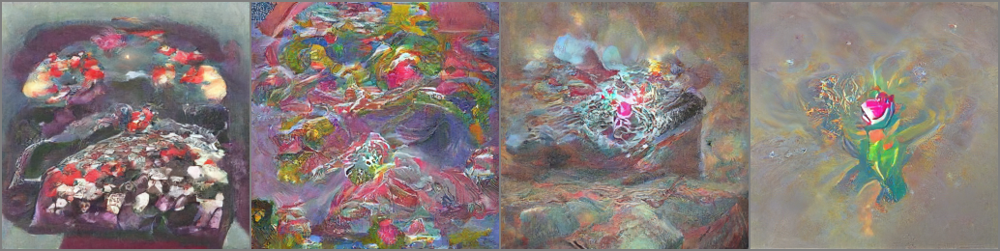    |
| Long exposure: long exposure photo of tokyo street, blurred motion, streaks of light, surreal, dreamy, ghosting effect, highly detailed | 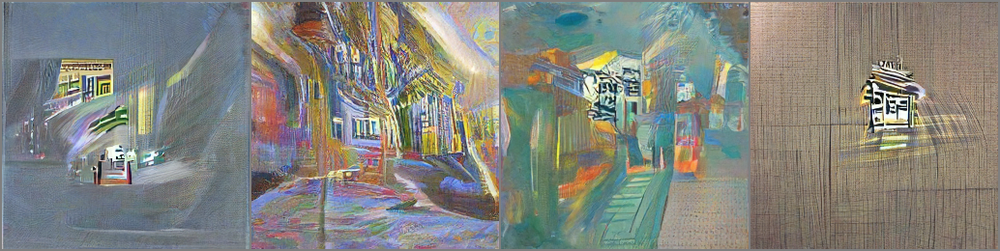    |
| Interior: a living room, bright modern Scandinavian style house, large windows, magazine photoshoot, 8k, studio lighting |  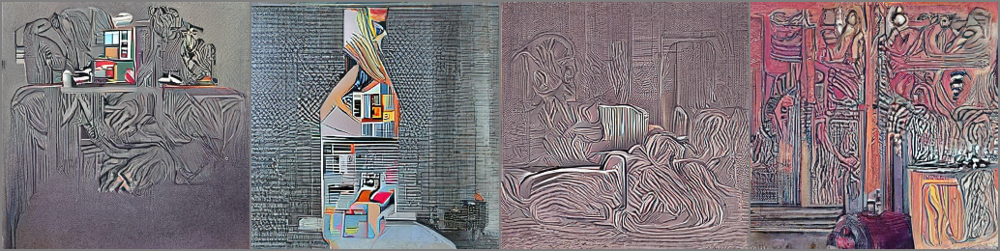    |
| Pixel: haunted house, pixel-art, low-res, blocky, pixel art style, 8-bit graphics, colorful               | 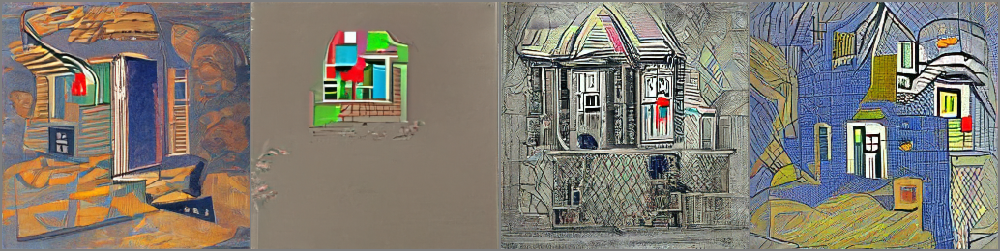    |
